# Preparation

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

# change working diretory
# import os
# os.chdir("/content/gdrive/MyDrive/Dissertation/")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!ls runs/detect
# %cd drive/MyDrive/Dissertation

val  val10  val2  val3	val4  val5  val6  val7	val8  val9


Make sure GPU work fine.

In [ ]:
!nvidia-smi

Wed Aug 23 10:14:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Make sure we are in the right working directory.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


Install YOLOv8.

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.134

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 26.6/166.8 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

# Train on the original dataset

## Download the original dataset

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="lOVTQ88BgSlHqrup7AYi")
project = rf.workspace("dissertation-bqltf").project("apple-detection-tg6vd")
dataset = project.version(1).download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Apple-Detection-1 in yolov8:: 100%|██████████| 2014/2014 [00:00<00:00, 3250.31it/s]


## Train the model

In [ ]:
%cd {HOME}

# !yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=400 imgsz=720 plots=True  # 300

# Tune1: batch size = 8; patience = 30
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=200 imgsz=720 plots=True batch=8 patience=30 # 32

# Tune2: batch size = 4; patience = 30
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=100 imgsz=720 plots=True batch=4 patience = 30 #

# Tune3: batch size = 12; patience = 30
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=100 imgsz=720 plots=True batch=12 patience = 30 #

# Tune4: batch size = 16; patience = 30
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=100 imgsz=720 plots=True patience = 30 # 31

# Tune5: imgsz=704
!yolo task=detect mode=train model={HOME}/runs/detect/train5/weights/last.pt data={dataset.location}/data.yaml epochs=100 imgsz=704 plots=True patience = 30 # 31



/content
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/Apple-Detection-1/data.yaml, epochs=100, patience=30, batch=16, imgsz=704, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dyna

In [ ]:
!ls {HOME}/runs/detect/train6/  # check the model is prodeced

args.yaml					     train_batch0.jpg
events.out.tfevents.1691342620.b2a27d82f0a6.90785.0  train_batch1.jpg
results.csv					     train_batch2.jpg
results.png					     weights


In [ ]:
%cp {HOME}/runs/detect/train6/weights/best.pt /content/gdrive/My\ Drive/Dissertation/Models
%cp {HOME}/runs/detect/train6/results.png /content/gdrive/My\ Drive/Dissertation/Models
%cp {HOME}/runs/detect/train6/confusion_matrix.png /content/gdrive/My\ Drive/Dissertation/Models
%cp {HOME}/runs/detect/train6/val_batch0_pred.jpg /content/gdrive/My\ Drive/Dissertation/Models


cp: cannot stat '/content/runs/detect/train6/confusion_matrix.png': No such file or directory
cp: cannot stat '/content/runs/detect/train6/val_batch0_pred.jpg': No such file or directory


/content


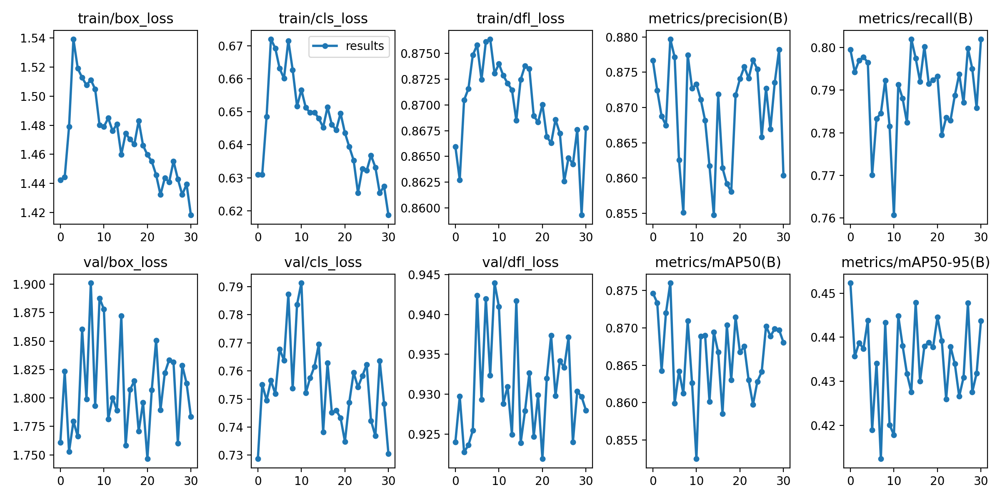

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train6/results.png', width=700)

## Validate the Model

In [ ]:
%cd {HOME}

# !yolo task=detect mode=val model={HOME}/gdrive/My\ Drive/Dissertation/Models/aug_best.pt data={dataset.location}/data.yaml

!yolo task=detect mode=val model={HOME}/runs/detect/train6/weights/best.pt data={dataset.location}/data.yaml

/content
2023-08-06 17:41:05.840335: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-06 17:41:06.703439: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Apple-Detection-1/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:20<00:00,  2.87s/it]
                   all        100       4015      0.877        0.8      0.875      0.454
Speed: 1.5ms pre-process, 12.5ms i

## Inference with the Model

In [ ]:
rf = Roboflow(api_key="lOVTQ88BgSlHqrup7AYi")
project = rf.workspace("dissertation-bqltf").project("minneapple-floor-set")
dataset = project.version(7).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to MinneApple-floor-set-7 in yolov8:: 100%|██████████| 112/112 [00:00<00:00, 2659.28it/s]


### Evaluate the model on test set
Produce the performance of the model on the test set.


In [ ]:
%cd {HOME}

# !yolo task=detect mode=val model={HOME}/runs/detect/train6/weights/best.pt data={dataset.location}/data_test.yaml
# !yolo task=detect mode=val model={HOME}/gdrive/MyDrive/Dissertation/Models/original_best.pt data={dataset.location}/data_test.yaml show_labels=False
# !yolo task=detect mode=val model={HOME}/gdrive/MyDrive/Dissertation/Models/augmented_best.pt data={dataset.location}/data_test.yaml show_labels=False
!yolo task=detect mode=val model={HOME}/gdrive/MyDrive/Dissertation/Models/aug_floor_best_temp.pt data={dataset.location}/data_test.yaml show_labels=False

/content
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients
val: Scanning /content/MinneApple-floor-set-7/test/labels... 10 images, 0 backgrounds, 0 corrupt: 100% 10/10 [00:00<00:00, 701.31it/s]
val: New cache created: /content/MinneApple-floor-set-7/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.55it/s]
                   all         10        782       0.92      0.788      0.882      0.533
                 apple         10        468      0.956      0.876      0.952       0.65
        apple_on_floor         10        314      0.884      0.701      0.812      0.416
Speed: 0.4ms preprocess, 18.0ms inference, 0.0ms loss, 17.7ms postprocess per image
Results saved to runs/detect/val11


### Produce detection results

In [ ]:
%cd {HOME}
# !yolo task=detect mode=predict model={HOME}/runs/detect/train6/weights/best.pt conf=0.5 source={dataset.location}/test/images save=True hide_labels=True
# !yolo task=detect mode=predict model={HOME}/gdrive/MyDrive/Dissertation/Models/original_best.pt conf=0.25 source={dataset.location}/test/images save=True hide_labels=True
!yolo task=detect mode=predict model={HOME}/gdrive/MyDrive/Dissertation/Models/aug_floor_best_temp.pt conf=0.25 source={dataset.location}/test/images save=True show_labels=False

/content
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients

image 1/10 /content/MinneApple-floor-set-7/test/images/20150919_174151_image161_png-_jpg.rf.26b948026e3d8d40e684f5cea5a96cb4.jpg: 736x416 113 apples, 4 apple_on_floors, 59.9ms
image 2/10 /content/MinneApple-floor-set-7/test/images/20150921_131234_image476_png-_jpg.rf.a8d763fa2b6f919f711f3c8d44ae447a.jpg: 736x416 57 apples, 32 apple_on_floors, 13.7ms
image 3/10 /content/MinneApple-floor-set-7/test/images/20150921_131234_image581_png-_jpg.rf.2de2f5aa2d36dbca6a9fd6f0101bf6f9.jpg: 736x416 12 apples, 12 apple_on_floors, 13.7ms
image 4/10 /content/MinneApple-floor-set-7/test/images/20150921_131346_image1046_png-_jpg.rf.2b4fbe550bb532a3a5a4033d49815882.jpg: 736x416 4 apples, 13.7ms
image 5/10 /content/MinneApple-floor-set-7/test/images/20150921_131346_image406_png_jpg.rf.90450878489d1dc7f9ddedf93e48204e.jpg: 736x416 55 apples, 35

**NOTE:** Let's take a look at few results.

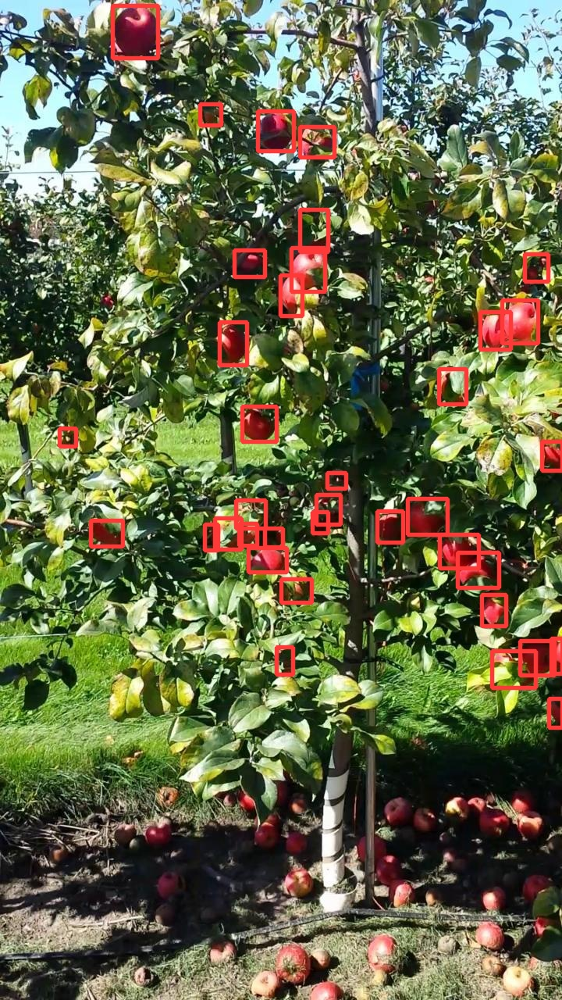

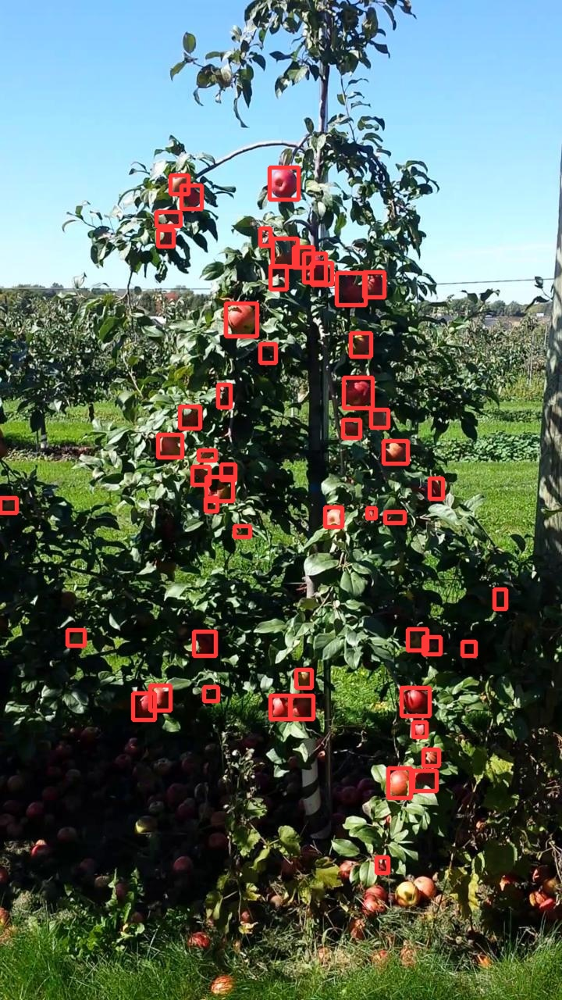

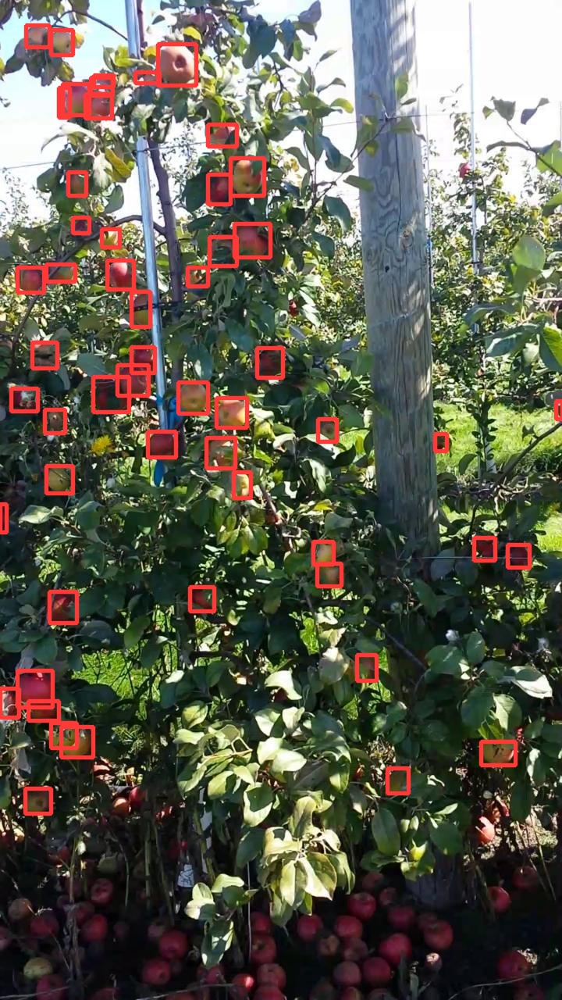

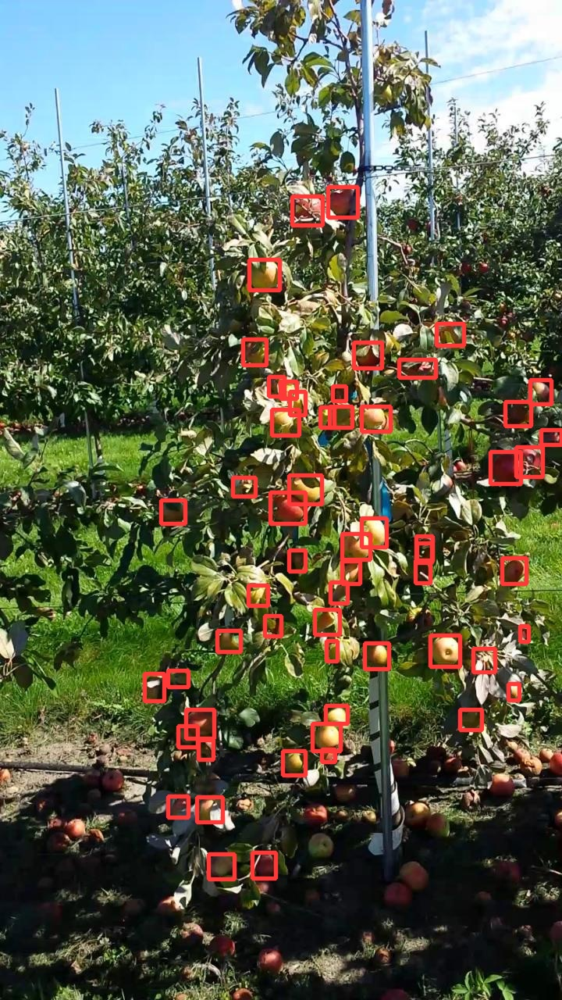

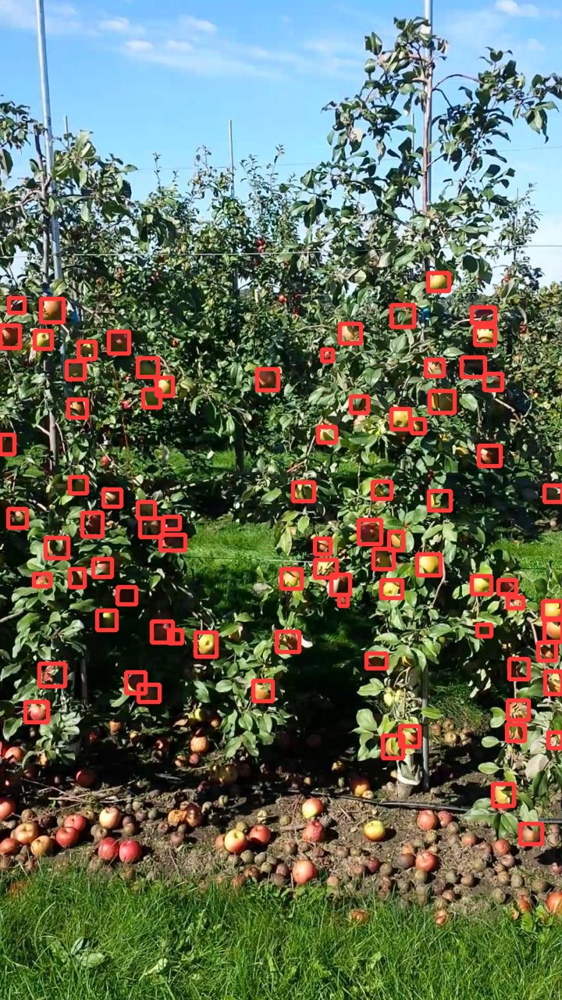

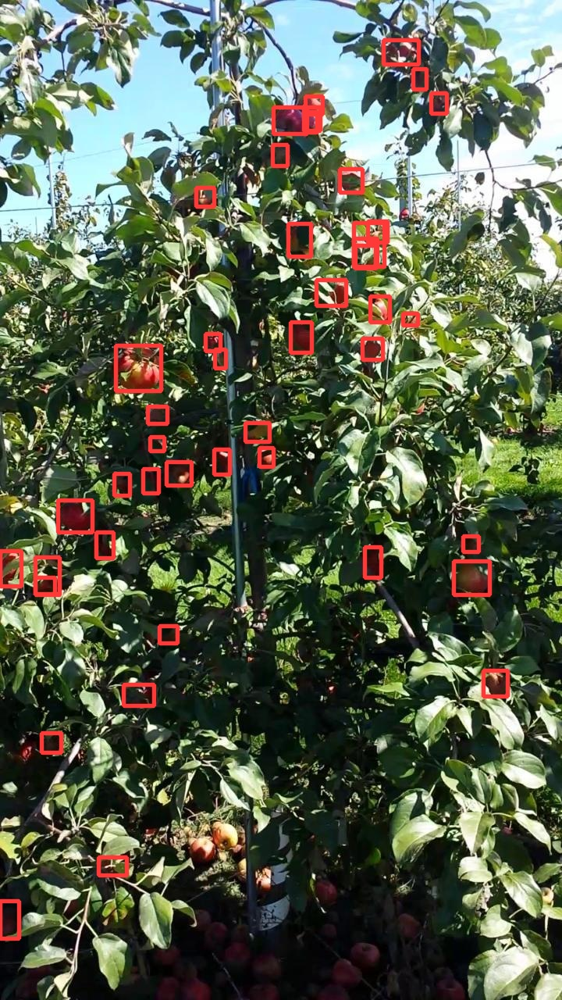

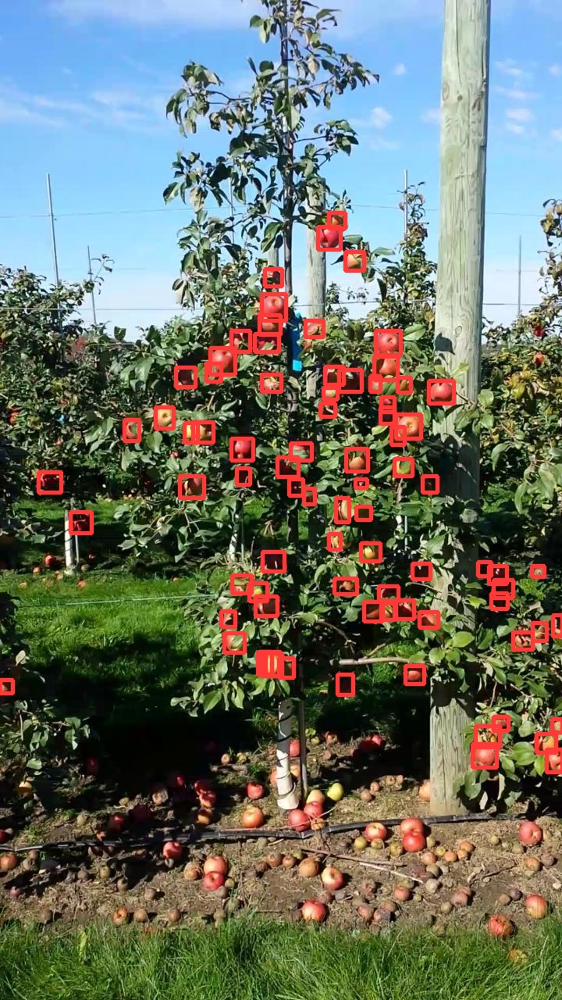

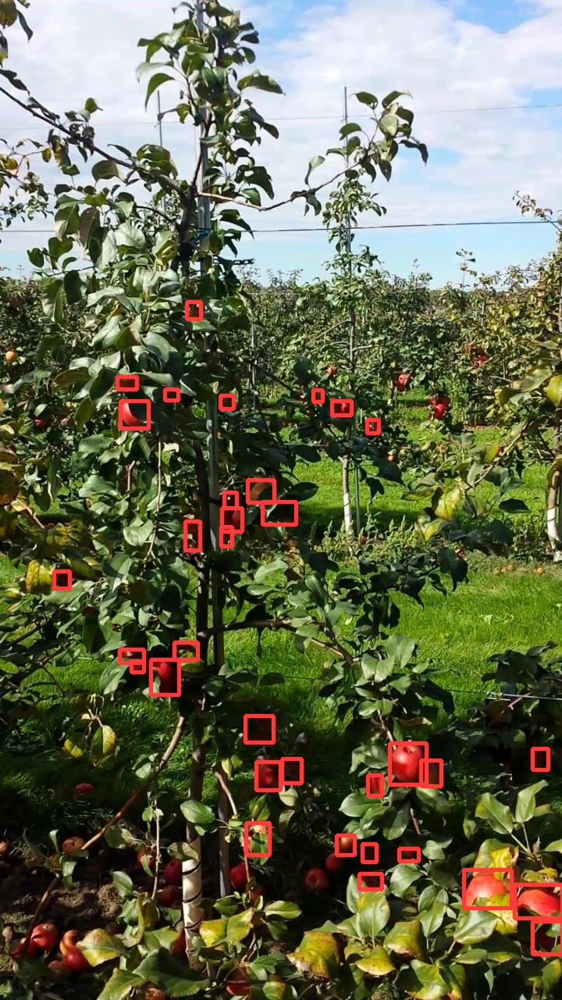

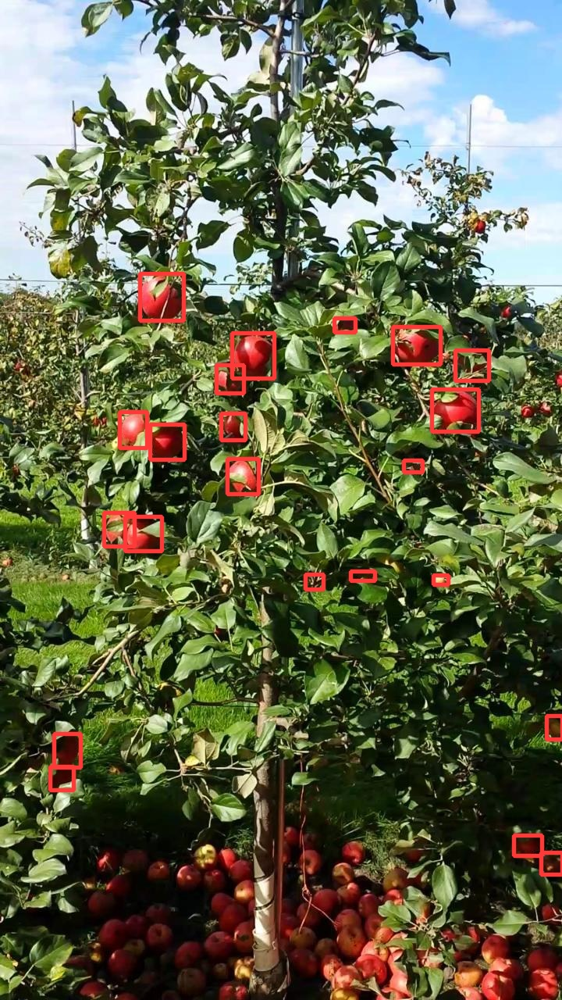

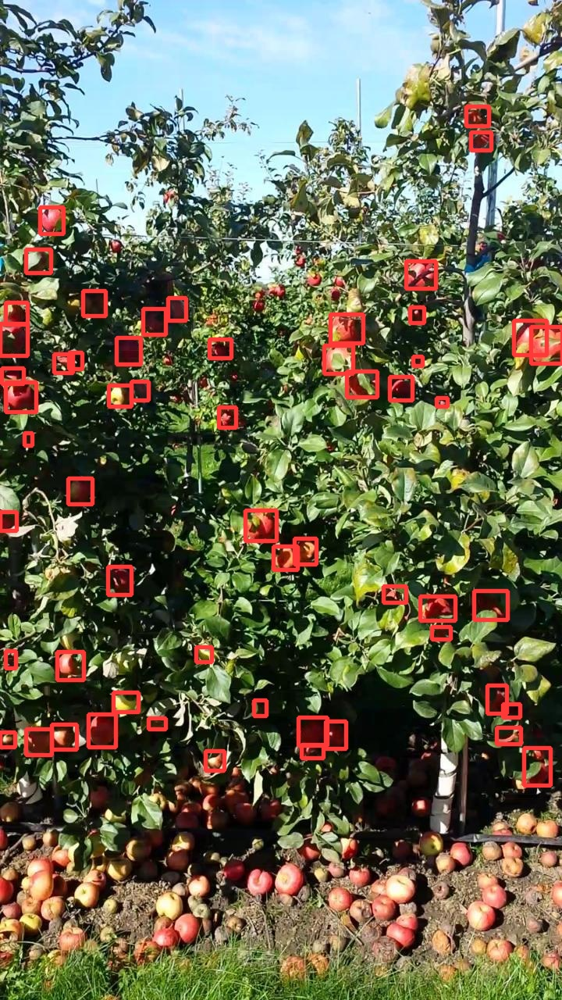

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[:10]:
      display(Image(filename=image_path, width=300))
      print("\n")

# Train on the augmented dataset

## Download the augmented dataset

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="lOVTQ88BgSlHqrup7AYi")
project = rf.workspace("dissertation-bqltf").project("apple-detection-tg6vd")
dataset = project.version(6).download("yolov8")



mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to Apple-Detection-6 in yolov8:: 100%|██████████| 3154/3154 [00:01<00:00, 1785.97it/s]


## Train the model

### Batch

In [ ]:
%cd {HOME}

# Train
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=30

# Tune 1: batch=4
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True batch=4 patience=30

# Tune 2: batch=8
# !yolo task=detect mode=train model={HOME}/runs/detect/train/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True batch=8 patience=30

# Tune 3: add gray scale augmentation
# !yolo task=detect mode=train model={HOME}/runs/detect/train/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=30
# !yolo task=detect mode=train model={HOME}/runs/detect/train3/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=30 # 44
!yolo task=detect mode=train model={HOME}/runs/detect/train3/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=50 # 44



### Gray

In [ ]:
%cd {HOME}

# Train
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=30

# Tune 1: batch=4
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True batch=4 patience=30

# Tune 2: batch=8
# !yolo task=detect mode=train model={HOME}/runs/detect/train/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True batch=8 patience=30

# Tune 3: add gray scale augmentation
# !yolo task=detect mode=train model={HOME}/runs/detect/train/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=30
# !yolo task=detect mode=train model={HOME}/runs/detect/train3/weights/last.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=30 # 44

# Train
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/ori_train.pt data={dataset.location}/data.yaml epochs=50 imgsz=720 plots=True patience=20  # 50
# !yolo task=detect mode=train model={HOME}/runs/detect/train5/weights/last.pt data={dataset.location}/data.yaml epochs=50 imgsz=720 plots=True patience=20 # 50
# !yolo task=detect mode=train model={HOME}/runs/detect/train6/weights/last.pt data={dataset.location}/data.yaml epochs=50 imgsz=720 plots=True patience=20 # 21
!yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/last.pt data={dataset.location}/data.yaml epochs=50 imgsz=720 plots=True patience=20 #



/content
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/Apple-Detection-3/data.yaml, epochs=50, patience=20, batch=16, imgsz=720, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynam

### Cutout

In [ ]:
%cd {HOME}

# Train
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/augmented_best.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True

# Tune 1:
# !yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/augmented_best.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=20

# Tune 2:
!yolo task=detect mode=train model={HOME}/gdrive/My\ Drive/Dissertation/Models/augmented_best.pt data={dataset.location}/data.yaml epochs=300 imgsz=720 plots=True patience=20 batch=32


[Errno 2] No such file or directory: '{HOME}'
/content
/bin/bash: line 1: yolo: command not found


In [ ]:
# !ls {HOME}/runs/detect/train4/  # check the model is prodeced

In [ ]:
%cp {HOME}/runs/detect/train4/weights/best.pt /content/gdrive/My\ Drive/Dissertation/Models
%cp {HOME}/runs/detect/train4/weights/last.pt /content/gdrive/My\ Drive/Dissertation/Models
%cp {HOME}/runs/detect/train4/results.png /content/gdrive/My\ Drive/Dissertation/Models
# %cp {HOME}/runs/detect/train/confusion_matrix.png /content/gdrive/My\ Drive/Dissertation/Models
# %cp {HOME}/runs/detect/train/val_batch0_pred.jpg /content/gdrive/My\ Drive/Dissertation/Models


/content


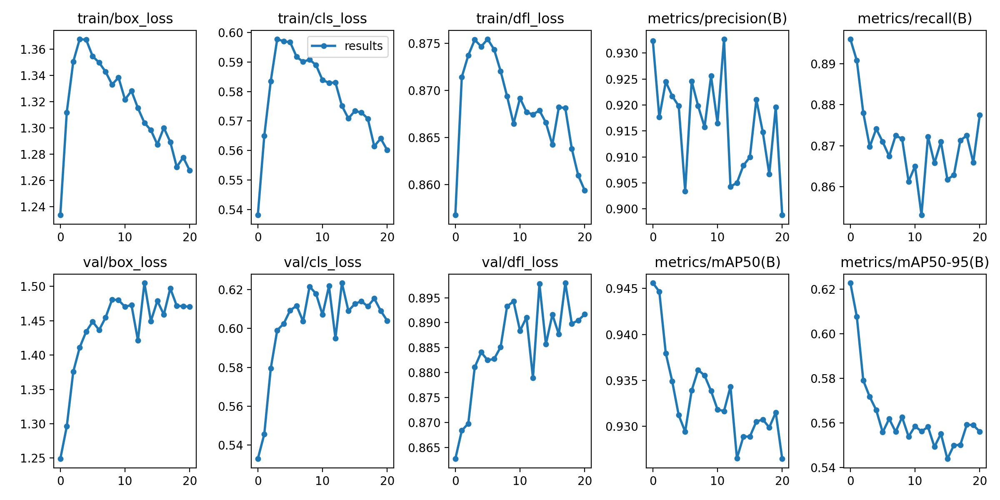

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train3/results.png', width=700)
# Image(filename=f'{HOME}/gdrive/MyDrive/Dissertation/Models/results.png', width=700)

In [ ]:
%cd {HOME}
# Image(filename=f'{HOME}/runs/detect/train7/confusion_matrix.png', width=700)

/content


## Validate the Model

In [ ]:
%cd {HOME}
# !yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

!yolo task=detect mode=val model={HOME}/gdrive/My\ Drive/Dissertation/Models/best.pt data={dataset.location}/data.yaml

## Inference with the Model

### Produce detection results

In [ ]:
%cd {HOME}
# !yolo task=detect mode=predict model={HOME}/runs/detect/train4/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True hide_labels=True

# !yolo task=detect mode=predict model={HOME}/gdrive/My\ Drive/Dissertation/Models/best.pt conf=0.25 source={dataset.location}/test/images save=True hide_labels=True

/content
2023-08-08 12:11:51.519501: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-08 12:11:51.583380: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-08 12:11:52.480925: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
image 1/331 /content/datasets/Apple-Detection-5/test/images/

**NOTE:** Let's take a look at few results.

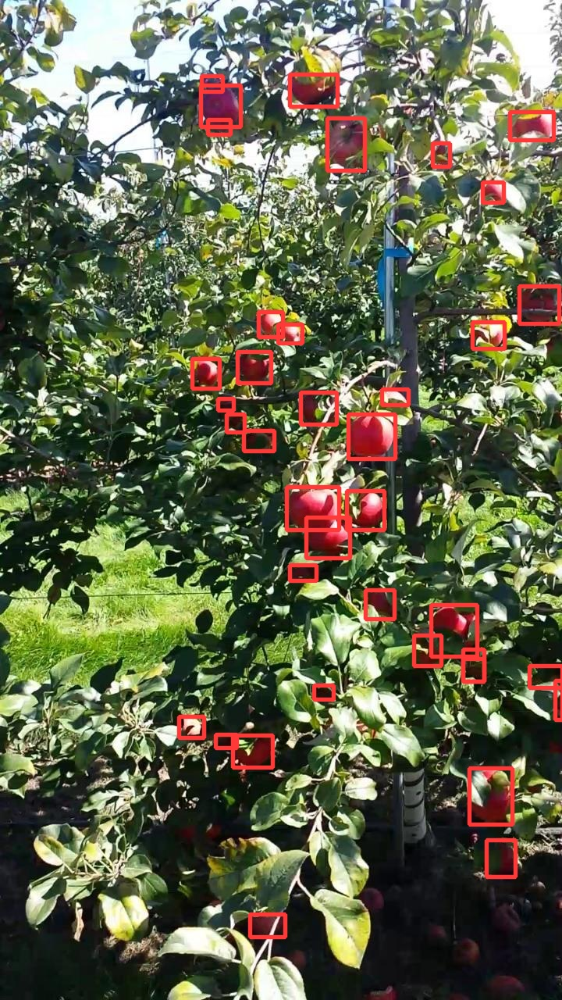

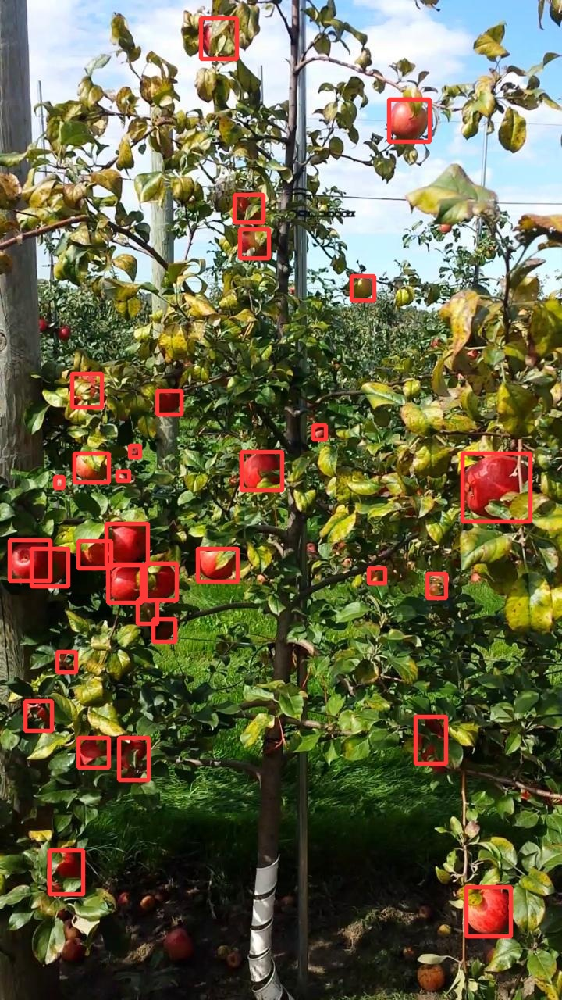

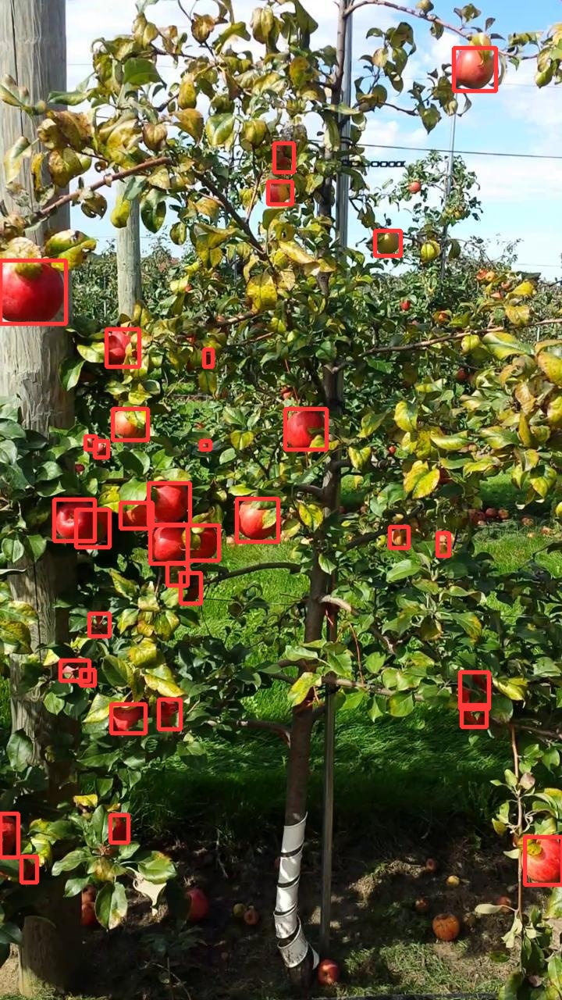

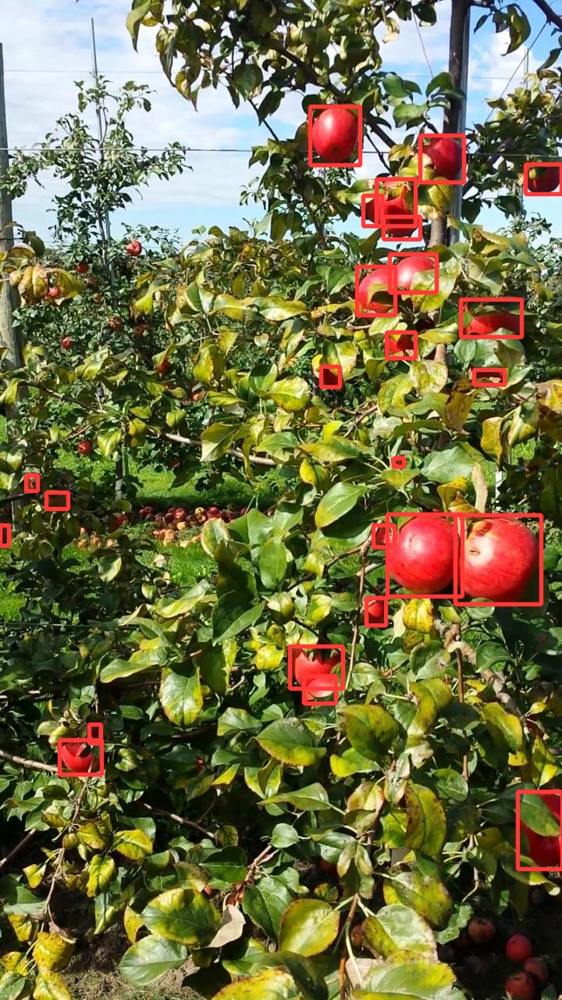

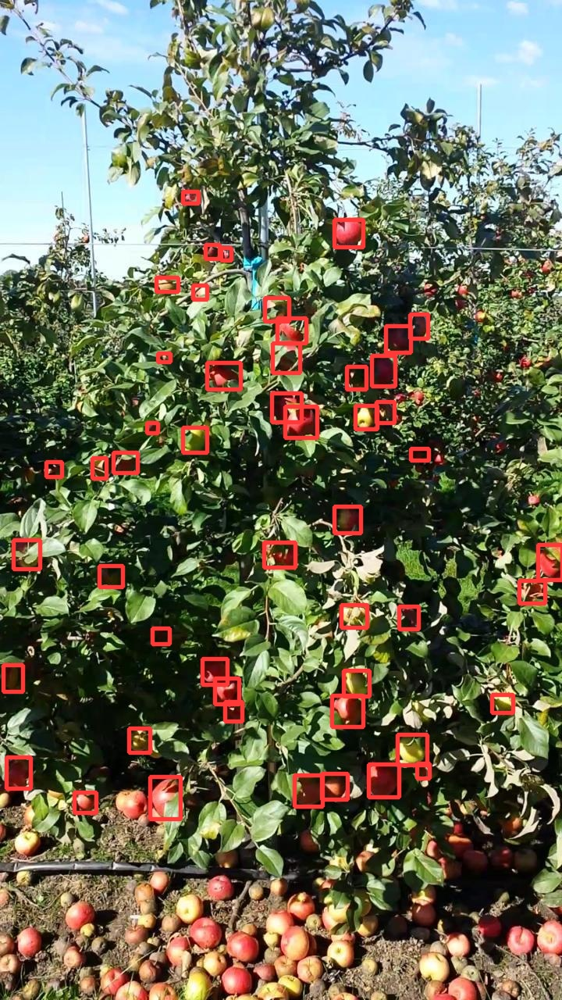

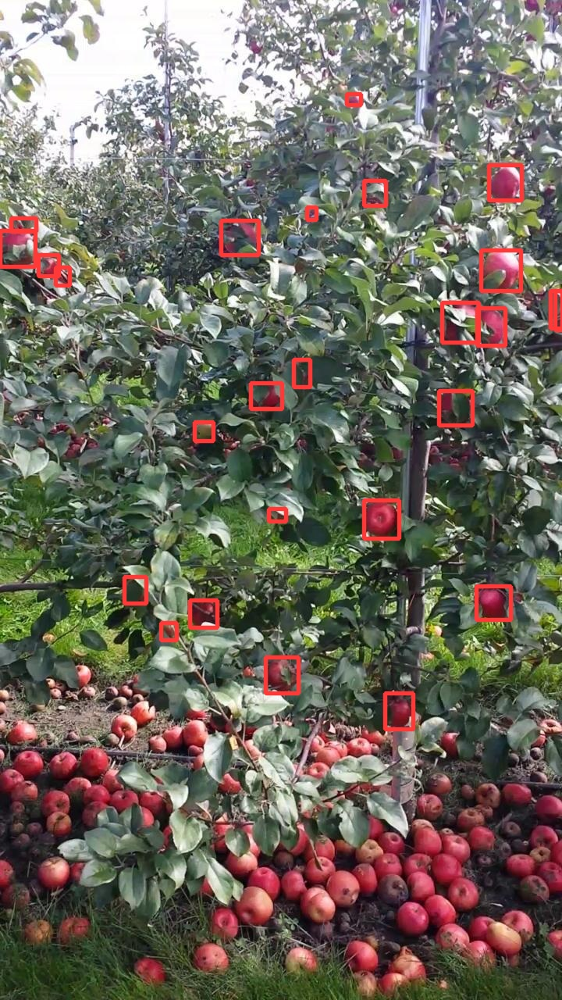

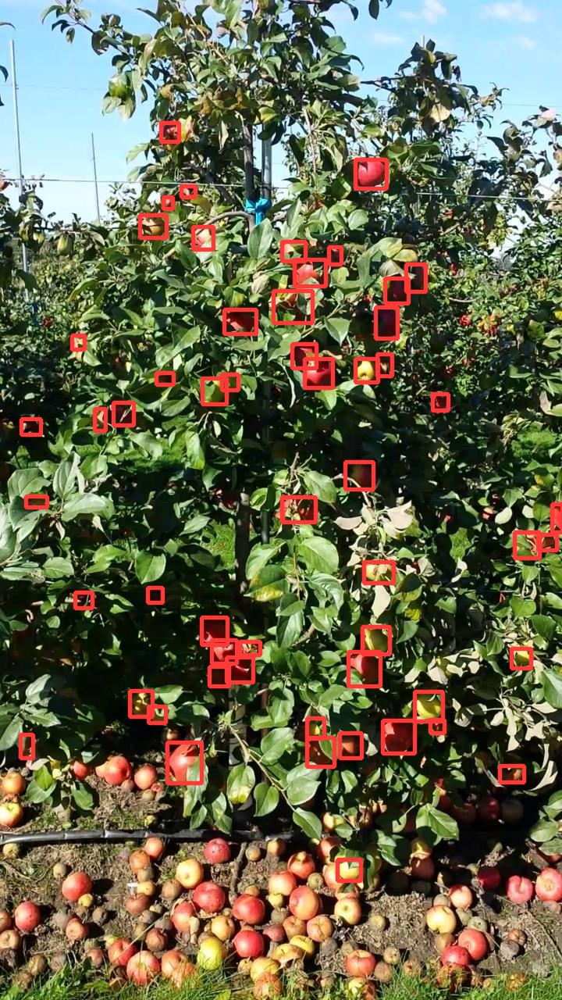

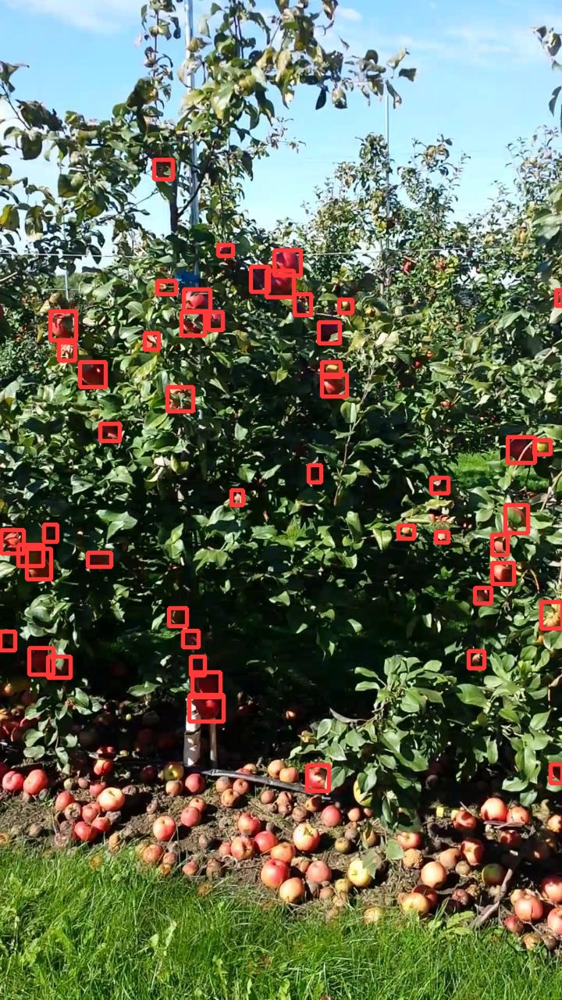

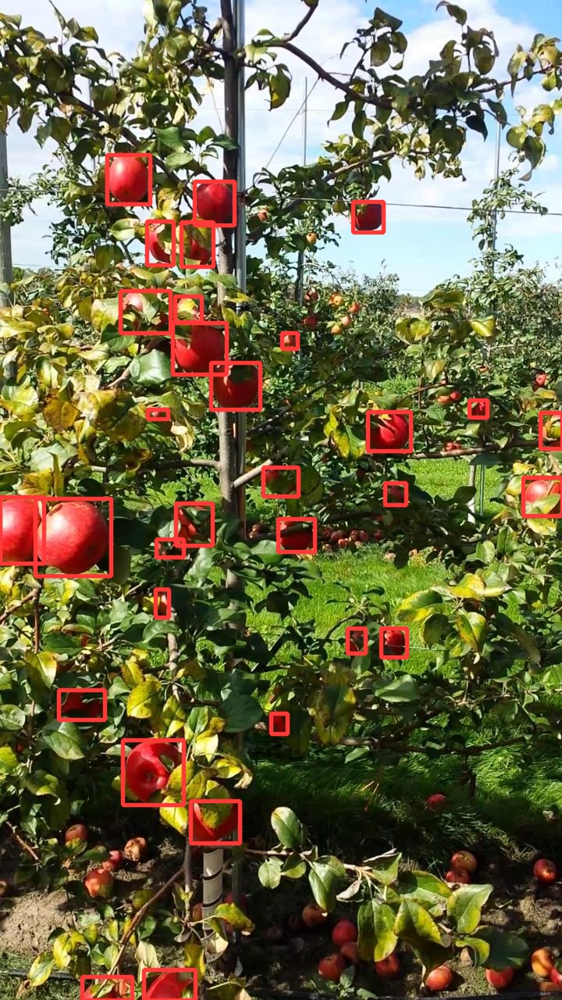

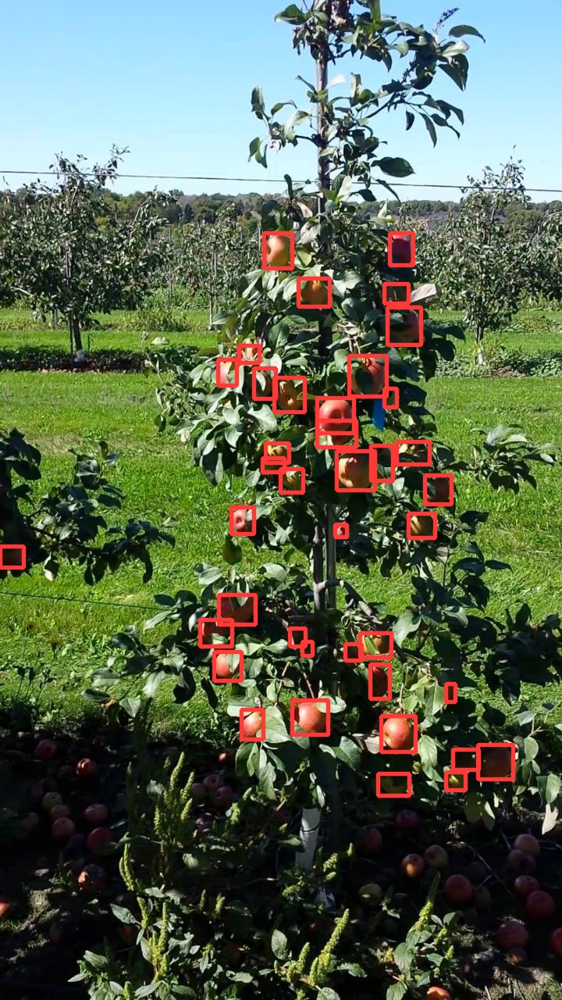

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:10]:
      display(Image(filename=image_path, width=300))
      print("\n")

### Evaluate the model on test set
Produce the performance of the model on the test set.

In [ ]:
%cd {HOME}

# !yolo task=detect mode=val model={HOME}/runs/detect/train4/weights/best.pt data={dataset.location}/data_test.yaml

!yolo task=detect mode=val model={HOME}/gdrive/MyDrive/Dissertation/Models/augmented_best.pt data={dataset.location}/data_test.yaml conf=0.32

/content
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients
val: Scanning /content/datasets/Apple-Detection-1/test/labels.cache... 331 images, 0 backgrounds, 0 corrupt: 100% 331/331 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 21/21 [00:39<00:00,  1.87s/it]
                   all        331      12285      0.934      0.897      0.938      0.731
Speed: 0.6ms preprocess, 7.1ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val10


# Produce Detection Examples

## Download the example dataset

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="lOVTQ88BgSlHqrup7AYi")
project = rf.workspace("dissertation-bqltf").project("fortest-2mhul")
dataset = project.version(1).download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to ForTest-1 in yolov8:: 100%|██████████| 26/26 [00:00<00:00, 2309.83it/s]


## Inference with the Model

### Evaluate the model on test set
Produce the performance of the model on the test set.

In [ ]:
%cd {HOME}

# !yolo task=detect mode=val model={HOME}/runs/detect/train4/weights/best.pt data={dataset.location}/data_test.yaml

# !yolo task=detect mode=val model={HOME}/gdrive/MyDrive/Dissertation/Models/original_best.pt data={dataset.location}/data_test.yaml
!yolo task=detect mode=val model={HOME}/gdrive/MyDrive/Dissertation/Models/augmented_best.pt data=/content/datasets/ForTest-1/data_test.yaml conf=0.34



/content
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients
val: Scanning /content/datasets/ForTest-1/test/labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100% 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.20it/s]
                   all         10        197      0.966      0.865      0.932      0.731
Speed: 0.2ms preprocess, 15.3ms inference, 0.0ms loss, 19.3ms postprocess per image
Results saved to runs/detect/val9


### Produce detection results

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train4/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True hide_labels=True

!yolo task=detect mode=predict model={HOME}/gdrive/My\ Drive/Dissertation/Models/original_best.pt conf=0.25 source={dataset.location}/test/images save=True hide_labels=True

/content
2023-08-08 12:11:51.519501: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-08 12:11:51.583380: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-08 12:11:52.480925: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
image 1/331 /content/datasets/Apple-Detection-5/test/images/

**NOTE:** Let's take a look at few results.

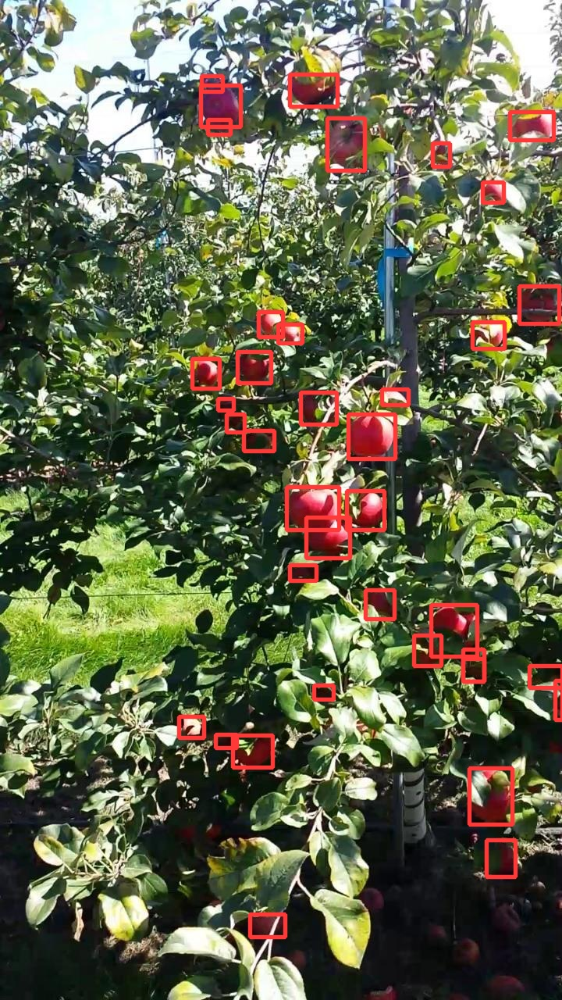

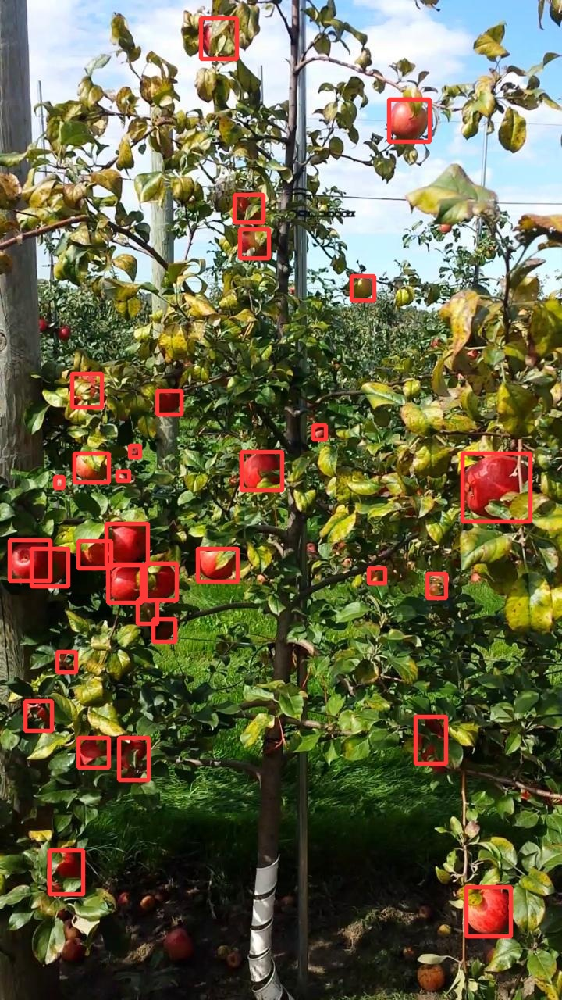

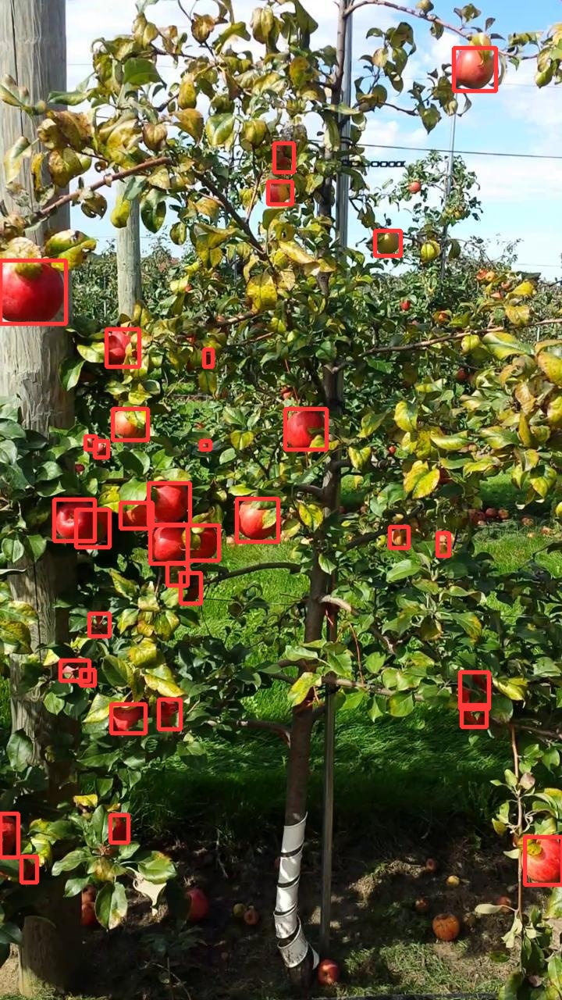

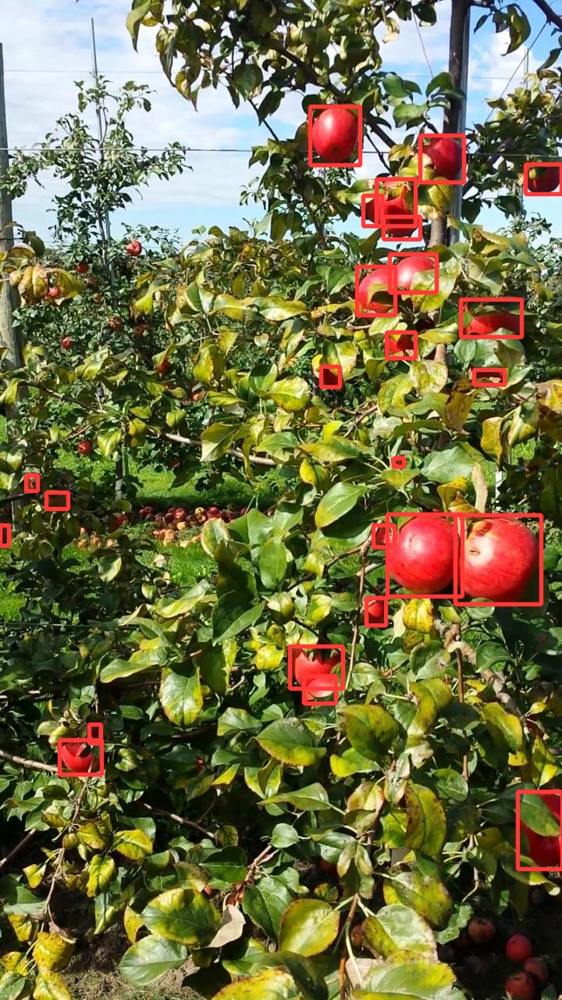

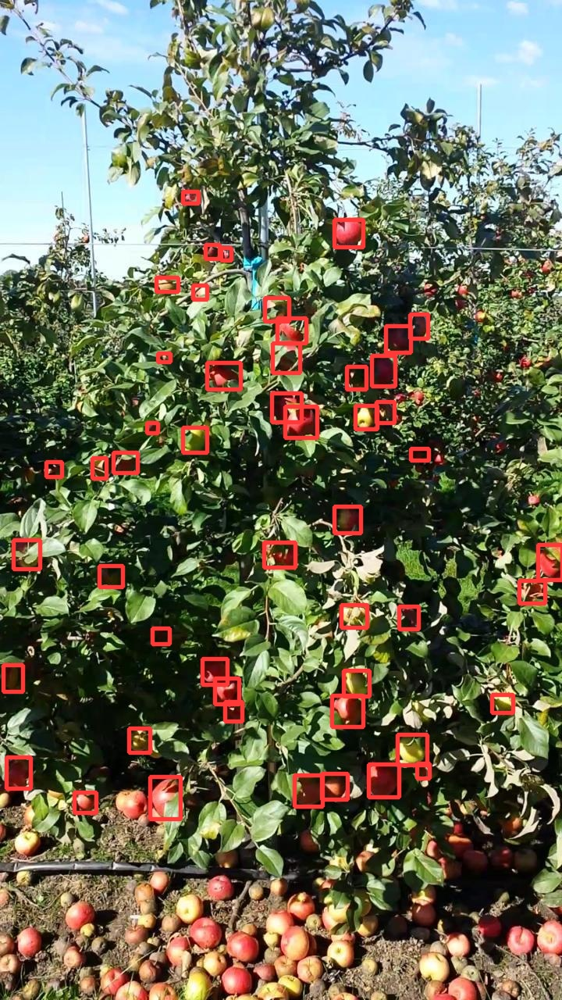

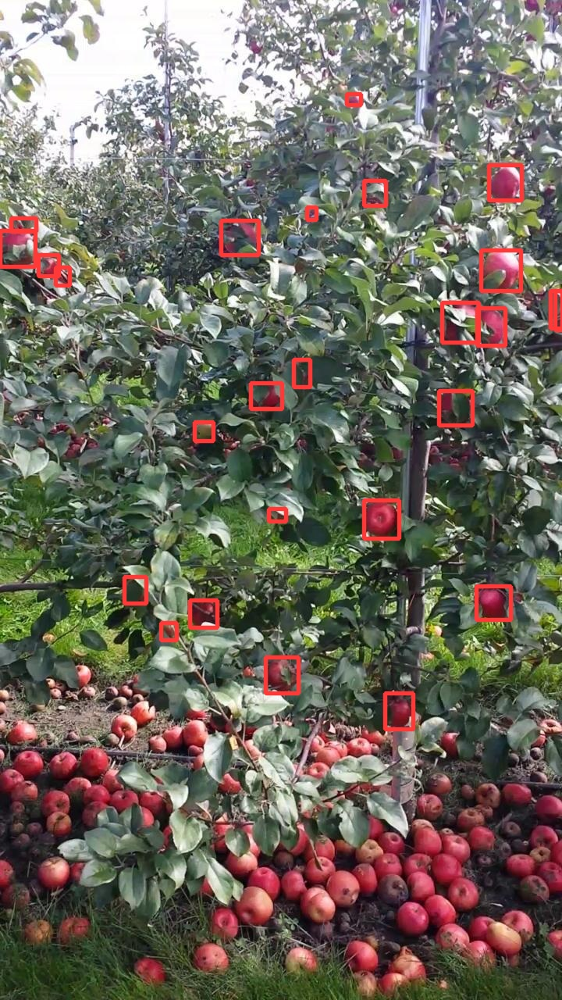

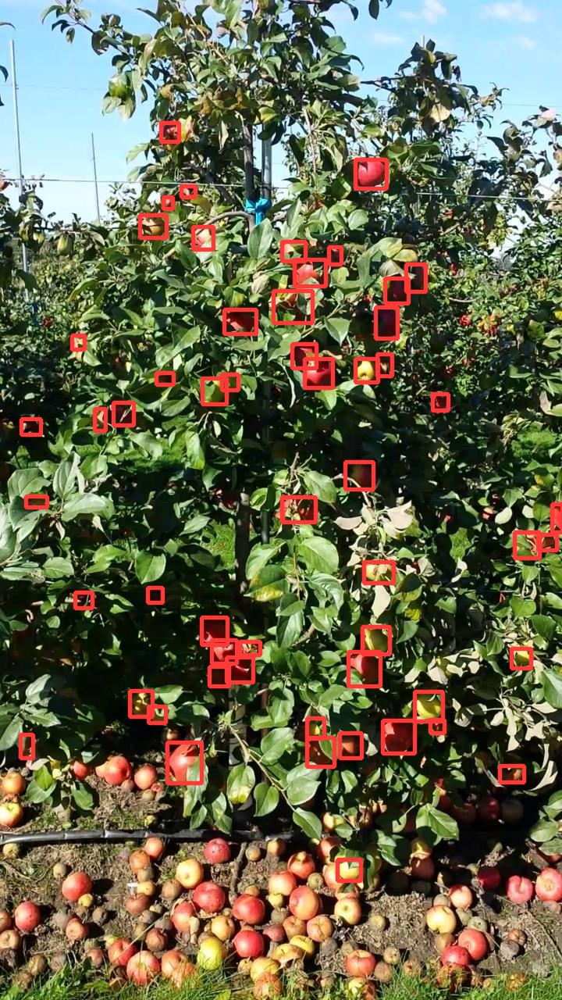

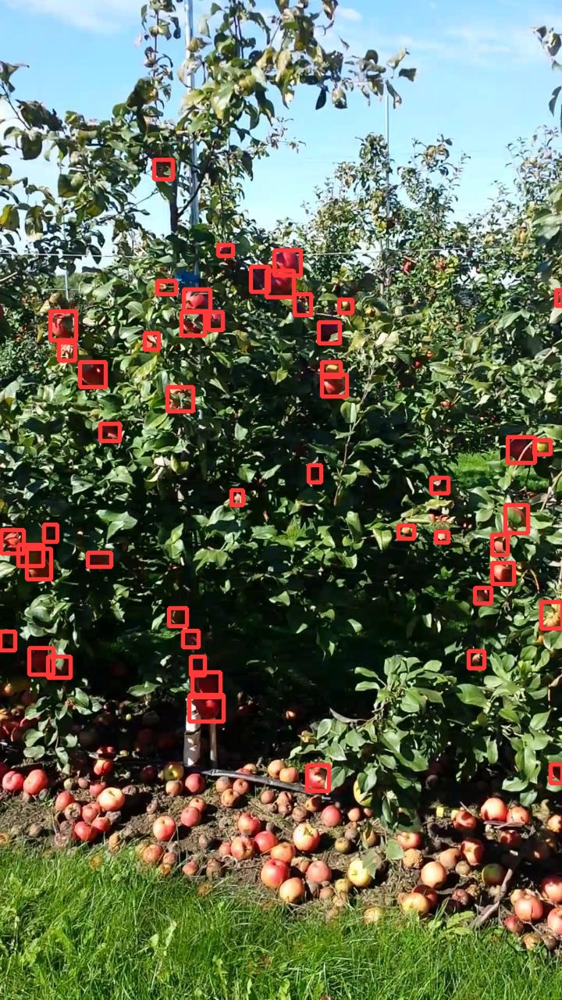

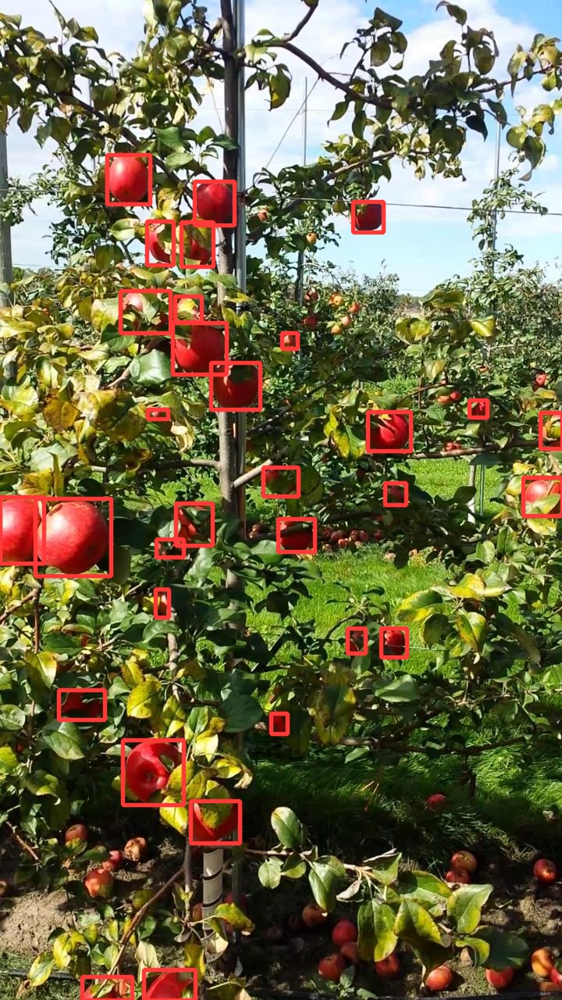

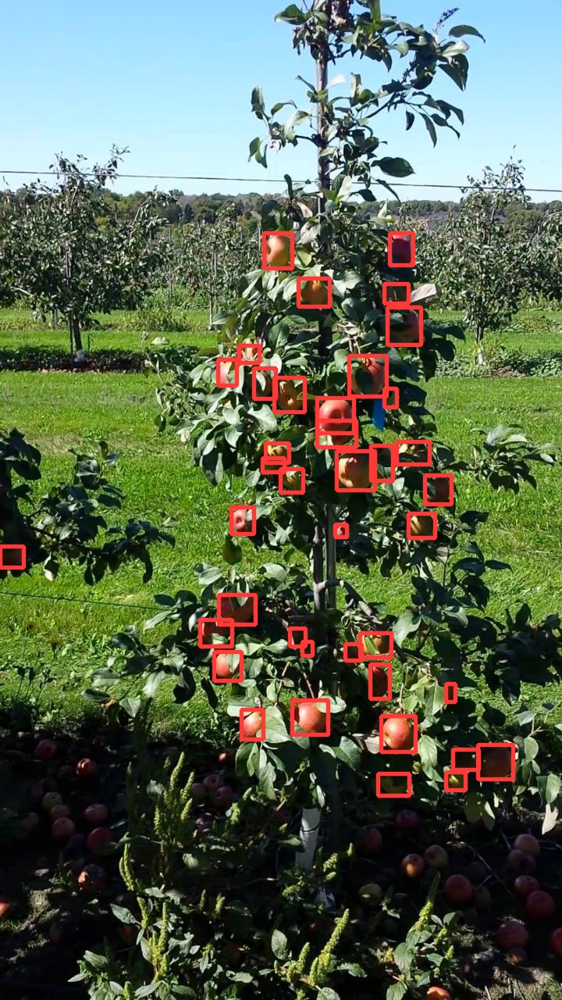

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:10]:
      display(Image(filename=image_path, width=300))
      print("\n")